In [43]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import math
import matplotlib.pyplot as plt
import plotly.express as px
from urllib.request import urlopen
import warnings
warnings.filterwarnings("ignore")
import plotly.graph_objs as go
from plotly.subplots import make_subplots
init_notebook_mode(connected=False)

In [44]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.integrate import odeint

from plotly.offline import iplot, init_notebook_mode
import math
import bokeh 
import matplotlib.pyplot as plt
import plotly.express as px
from urllib.request import urlopen
import json
from dateutil import parser
#from bokeh.layouts import gridplot
#from bokeh.plotting import figure, show, output_file
#from bokeh.layouts import row, column
#from bokeh.resources import INLINE
#from bokeh.io import output_notebook
#from bokeh.models import Span
import warnings
warnings.filterwarnings("ignore")
#output_notebook(resources=INLINE)

In [45]:
country_codes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')
country_codes = country_codes.drop('GDP (BILLIONS)', 1)
country_codes.rename(columns={'COUNTRY': 'Country', 'CODE': 'Code'}, inplace=True)

In [46]:
virus_data = pd.read_csv('novel-corona-virus-2019-dataset/covid_19_data.csv')

prev_index = 0
first_time = False
tmp = 0


for i, row in virus_data.iterrows():

    if(virus_data.loc[i,'SNo'] < 1342 and virus_data.loc[i,'Province/State']=='Hubei'):
        if(first_time):
            tmp = virus_data.loc[i,'Confirmed']
            prev_index = i
            virus_data.loc[i,'Confirmed'] = virus_data.loc[i,'Confirmed'] + 593
            first_time = False
        else:
            increment = virus_data.loc[i,'Confirmed'] - tmp
            tmp = virus_data.loc[i,'Confirmed']
            virus_data.loc[i,'Confirmed'] = virus_data.loc[prev_index,'Confirmed'] + increment + 593
            prev_index = i
    

virus_data.rename(columns={'Country/Region': 'Country', 'ObservationDate': 'Date'}, inplace=True)
virus_data = virus_data.fillna('unknow')
virus_data['Country'] = virus_data['Country'].str.replace('US','United States')
virus_data['Country'] = virus_data['Country'].str.replace('UK','United Kingdom') 
virus_data['Country'] = virus_data['Country'].str.replace('Mainland China','China')
virus_data['Country'] = virus_data['Country'].str.replace('South Korea','Korea, South')
virus_data['Country'] = virus_data['Country'].str.replace('North Korea','Korea, North')

In [47]:
virus_data = pd.merge(virus_data,country_codes, on='Country', how='left',sort=False)

In [48]:
top_country = virus_data.loc[virus_data['Date'] == virus_data['Date'].iloc[-1]]
top_country = top_country.groupby(['Code','Country'])['Confirmed'].sum().reset_index() 
top_country = top_country.sort_values('Confirmed', ascending=False)
top_country = top_country[:30]
top_country_codes = top_country['Country']
top_country_codes = list(top_country_codes)

#countries = virus_data.loc[virus_data['Country'] in top_country_codes]
countries = virus_data[virus_data['Country'].isin(top_country_codes)]
countries_day = countries.groupby(['Date','Code','Country'])['Confirmed','Deaths','Recovered'].sum().reset_index()


exponential_line_x = []
exponential_line_y = []
for i in range(16):
    exponential_line_x.append(i)
    exponential_line_y.append(i)
    
## TOP 30 ##
china = countries_day.loc[countries_day['Code']=='CHN']

new_confirmed_cases_china = []
new_confirmed_cases_china.append( list(china['Confirmed'])[0] - list(china['Deaths'])[0] 
                           - list(china['Recovered'])[0] )

for i in range(1,len(china)):

    new_confirmed_cases_china.append( list(china['Confirmed'])[i] - 
                                     list(china['Deaths'])[i] - 
                                     list(china['Recovered'])[i])
    
    
italy = countries_day.loc[countries_day['Code']=='ITA']

new_confirmed_cases_ita = []
new_confirmed_cases_ita.append( list(italy['Confirmed'])[0] - list(italy['Deaths'])[0] 
                           - list(italy['Recovered'])[0] )

for i in range(1,len(italy)):
    
    new_confirmed_cases_ita.append( list(italy['Confirmed'])[i] - 
                                  list(italy['Deaths'])[i] - 
                                  list(italy['Recovered'])[i])
    
    
india = countries_day.loc[countries_day['Code']=='IND']

new_confirmed_cases_india = []
new_confirmed_cases_india.append( list(india['Confirmed'])[0] - list(india['Deaths'])[0] 
                           - list(india['Recovered'])[0] )

for i in range(1,len(india)):
    
    new_confirmed_cases_india.append( list(india['Confirmed'])[i] - 
                                     list(india['Deaths'])[i] - 
                                    list(india['Recovered'])[i])
    

spain = countries_day.loc[countries_day['Code']=='ESP']

new_confirmed_cases_spain = []
new_confirmed_cases_spain.append( list(spain['Confirmed'])[0] - list(spain['Deaths'])[0] 
                           - list(spain['Recovered'])[0] )

for i in range(1,len(spain)):
    
    new_confirmed_cases_spain.append( list(spain['Confirmed'])[i] - 
                                     list(spain['Deaths'])[i] - 
                                    list(spain['Recovered'])[i])
    

us = countries_day.loc[countries_day['Code']=='USA']

new_confirmed_cases_us = []
new_confirmed_cases_us.append( list(us['Confirmed'])[0] - list(us['Deaths'])[0] 
                           - list(us['Recovered'])[0] )

for i in range(1,len(us)):
    
    new_confirmed_cases_us.append( list(us['Confirmed'])[i] - 
                                     list(us['Deaths'])[i] - 
                                    list(us['Recovered'])[i])
    
    
german = countries_day.loc[countries_day['Code']=='DEU']

new_confirmed_cases_german = []
new_confirmed_cases_german.append( list(german['Confirmed'])[0] - list(german['Deaths'])[0] 
                           - list(german['Recovered'])[0] )

for i in range(1,len(german)):
    
    new_confirmed_cases_german.append( list(german['Confirmed'])[i] - 
                                     list(german['Deaths'])[i] - 
                                    list(german['Recovered'])[i])
    

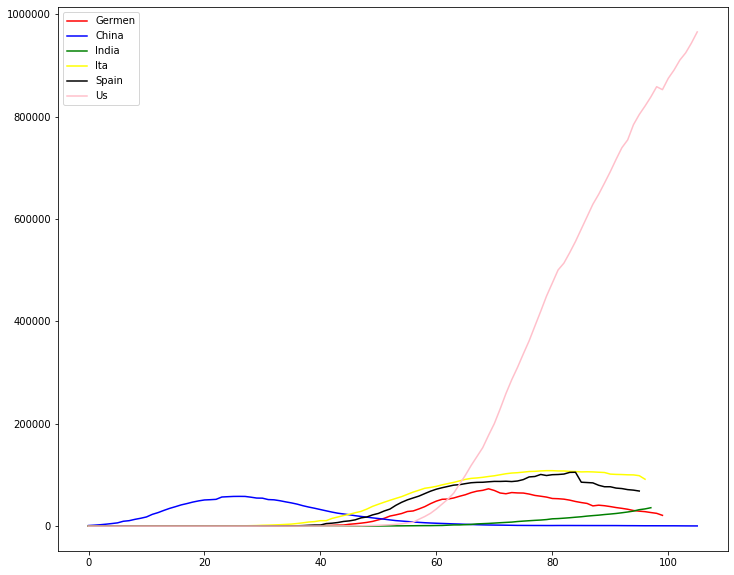

In [49]:
p1 = plt.figure(figsize= [12, 10])
plt.plot(new_confirmed_cases_german,color='red', label='Germen')
plt.plot(new_confirmed_cases_china,color='blue', label='China')
plt.plot(new_confirmed_cases_india,color='green', label='India')
plt.plot(new_confirmed_cases_ita,color='yellow', label='Ita')
plt.plot(new_confirmed_cases_spain,color='black', label='Spain')
plt.plot(new_confirmed_cases_us,color='pink', label='Us')
plt.legend()
plt.show()

In [50]:
corona_data=pd.read_csv('novel-corona-virus-2019-dataset/covid_19_data.csv')
choro_map=px.choropleth(corona_data, 
                    locations="Country/Region", 
                    locationmode = "country names",
                    color="Confirmed", 
                    hover_name="Country/Region", 
                    animation_frame="ObservationDate"
                   )

choro_map.update_layout(
    title_text = 'Global Spread of Coronavirus',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
    
choro_map.show()

In [51]:
zone=pd.read_csv('novel-corona-virus-2019-dataset/lockdownindiawarningzones.csv')
zone.head()

,S.no,District,State,Zone
0,1,South Andamans,Andaman And Nicobar Islands,Red Zone
1,2,Nicobars,Andaman And Nicobar Islands,Green Zone
2,3,North And Middle Andaman,Andaman And Nicobar Islands,Green Zone
3,4,Kurnool,Andhra Pradesh,Red Zone
4,5,Guntur,Andhra Pradesh,Red Zone


In [52]:
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]}')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()
    
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

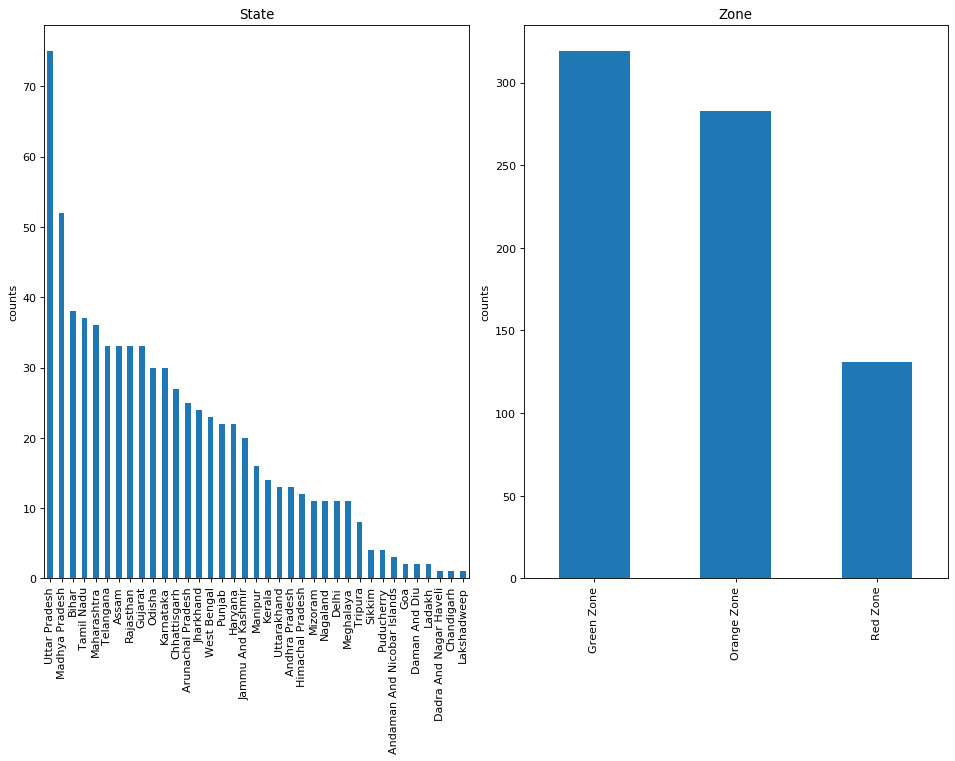

In [53]:
plotPerColumnDistribution(zone, 10, 5)

In [54]:
covid_India_cases = pd.read_csv('novel-corona-virus-2019-dataset/covid_19_india.csv')
covid_India_cases.rename(columns={'State/UnionTerritory': 'State', 'Cured': 'Recovered', 'Confirmed': 'Confirmed'}, inplace=True)

statewise_cases = pd.DataFrame(covid_India_cases.groupby(['State'])['Confirmed', 'Deaths', 'Recovered'].max().reset_index())
statewise_cases["Country"] = "India" # in order to have a single root node
fig = px.treemap(statewise_cases, path=['Country','State'], values='Confirmed',
                  color='Confirmed', hover_data=['State'],
                  color_continuous_scale='Rainbow')
fig.show()

In [55]:
import IPython
IPython.display.HTML('<div class="flourish-embed flourish-bar-chart-race" data-src="visualisation/1977187" data-url="https://flo.uri.sh/visualisation/1977187/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>')

In [56]:
covid_India_cases = pd.read_csv('novel-corona-virus-2019-dataset/covid_19_india.csv')
covid_India_cases.rename(columns={'State/UnionTerritory': 'State', 'Cured': 'Recovered', 'Confirmed': 'Confirmed'}, inplace=True)

statewise_cases = pd.DataFrame(covid_India_cases.groupby(['State'])['Confirmed', 'Deaths', 'Recovered'].max().reset_index())
last=statewise_cases
pos=pd.read_csv('novel-corona-virus-2019-dataset/UTM ZONES of INDIA.csv')
ind_grp=last.merge(pos , left_on='State', right_on='State / Union Territory')

In [57]:
import folium
map = folium.Map(location=[20.5937, 78.9629], zoom_start=4,tiles='cartodbpositron')

for lat, lon,state,Confirmed,Recovered,Deaths in zip(ind_grp['Latitude'], ind_grp['Longitude'],ind_grp['State'],ind_grp['Confirmed'],ind_grp['Recovered'],ind_grp['Deaths']):
    folium.CircleMarker([lat, lon],
                        radius=5,
                        color='YlOrRd',
                      popup =(
                    'State: ' + str(state) + '<br>'
                    'Confirmed: ' + str(Confirmed) + '<br>'
                      'Recovered: ' + str(Recovered) + '<br>'
                      'Deaths: ' + str(Deaths) + '<br>'),

                        fill_color='red',
                        fill_opacity=0.7 ).add_to(map)
map

In [58]:
from folium.plugins import HeatMap
m = folium.Map(location = [20.5937, 78.9629], zoom_start = 4,tiles='cartodbpositron',columns = ['State/UnionTerritory','Confirmed'],)

heat_data = [[row['Latitude'],row['Longitude']] for index, row in ind_grp.iterrows()]
HeatMap(heat_data,radius=16.5, blur = 6.5).add_to(m)

m

In [59]:
ind_map=pd.read_csv('novel-corona-virus-2019-dataset/covid_19_india.csv')
#ind_map.head()
pos=pd.read_csv('novel-corona-virus-2019-dataset/UTM ZONES of INDIA.csv')
ind_map1=ind_map.merge(pos , left_on='State/UnionTerritory', right_on='State / Union Territory')
#ind_map1.head()

In [60]:
#ind_map = ind_grp
ind_map1  = ind_map1.groupby(['Date', 'State/UnionTerritory','Latitude','Longitude'])['Confirmed'].sum()


ind_map1 = ind_map1.reset_index()
ind_map1.head()
ind_map1['size'] = ind_map1['Confirmed']*90000000
ind_map1
fig = px.scatter_mapbox(ind_map1, lat="Latitude", lon="Longitude",
                     color="Confirmed", size='size',hover_data=['State/UnionTerritory'],
                     color_continuous_scale='burgyl', animation_frame="Date", 
                     title='Spread total cases over time in India')
fig.update(layout_coloraxis_showscale=True)
fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=3, mapbox_center = {"lat":20.5937,"lon":78.9629})
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

In [66]:
conda install -c conda-forge squarify


Note: you may need to restart the kernel to use updated packages.



CondaHTTPError: HTTP 000 CONNECTION FAILED for url <https://conda.anaconda.org/conda-forge/win-64/repodata.json>
Elapsed: -

An HTTP error occurred when trying to retrieve this URL.
HTTP errors are often intermittent, and a simple retry will get you on your way.
'https://conda.anaconda.org/conda-forge/win-64'




In [71]:
import pandas as pd
import numpy as np
import datetime
import requests
import warnings

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
#import squarify
import plotly_express as px


from IPython.display import Image
warnings.filterwarnings('ignore')
%matplotlib inline

In [72]:
age_details = pd.read_csv('novel-corona-virus-2019-dataset/AgeGroupDetails.csv')
india_covid_19 = pd.read_csv('novel-corona-virus-2019-dataset/covid_19_india.csv')
hospital_beds = pd.read_csv('novel-corona-virus-2019-dataset/HospitalBedsIndia.csv')
individual_details = pd.read_csv('novel-corona-virus-2019-dataset/IndividualDetails.csv')
ICMR_details = pd.read_csv('novel-corona-virus-2019-dataset/ICMRTestingDetails.csv')
ICMR_labs = pd.read_csv('novel-corona-virus-2019-dataset/ICMRTestingLabs.csv')
state_testing = pd.read_csv('novel-corona-virus-2019-dataset/StatewiseTestingDetails.csv')

In [73]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recovered_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/04-04-2020.csv')

In [74]:
india_covid_19['Date'] = pd.to_datetime(india_covid_19['Date'])
state_testing['Date'] = pd.to_datetime(state_testing['Date'])

In [75]:
cumulative_df = india_covid_19.groupby(["State/UnionTerritory", "Date"])["Confirmed", "Deaths", "Cured"].sum().reset_index()
cumulative_df["Date"] = pd.to_datetime(cumulative_df["Date"] , format="%m/%d/%Y").dt.date
cumulative_df = cumulative_df.sort_values(by="Date").reset_index(drop=True)
start_date = datetime.date(2020, 3, 10)
cumulative_df = cumulative_df[cumulative_df["Date"]>=start_date]
cumulative_df["Date"] = cumulative_df["Date"].astype(str)

fig = px.scatter(cumulative_df, x="Confirmed", y="Deaths", animation_frame="Date", animation_group="State/UnionTerritory",
           size="Confirmed", color="State/UnionTerritory", hover_name="State/UnionTerritory",
           log_x=False, size_max=55, range_x=[0,15000], range_y=[-20,800])

layout = go.Layout(
    title=go.layout.Title(
        text="Changes in number of confirmed & death cases over time in India states",
        x=0.5
    ),
    font=dict(size=14),
    xaxis_title = "Total number of confirmed cases",
    yaxis_title = "Total number of death cases"
)

fig.update_layout(layout)

fig.show()

In [76]:
import plotly.express as px

fig = px.pie(age_details, values='TotalCases', names='AgeGroup',title='Confirmed cases of India')
fig.show()

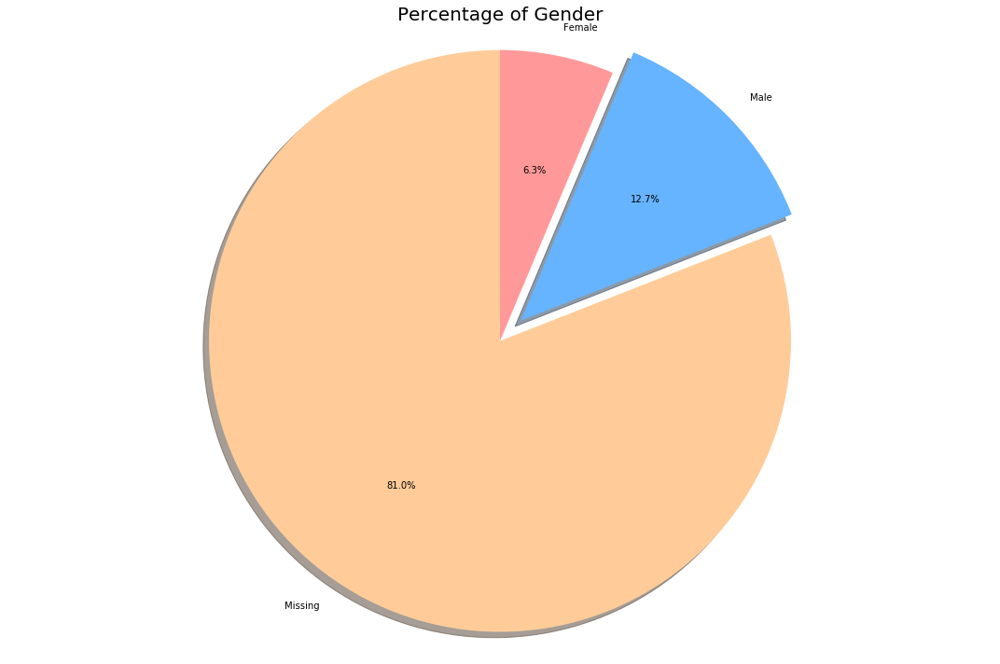

In [77]:
labels = ['Missing', 'Male', 'Female']
sizes = []
sizes.append(individual_details['gender'].isnull().sum())
sizes.append(list(individual_details['gender'].value_counts())[0])
sizes.append(list(individual_details['gender'].value_counts())[1])

explode = (0, 0.1, 0)
colors = ['#ffcc99','#66b3ff','#ff9999']

plt.figure(figsize= (15,10))
plt.title('Percentage of Gender',fontsize = 20)
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',shadow=True, startangle=90)
plt.axis('equal')
plt.tight_layout()

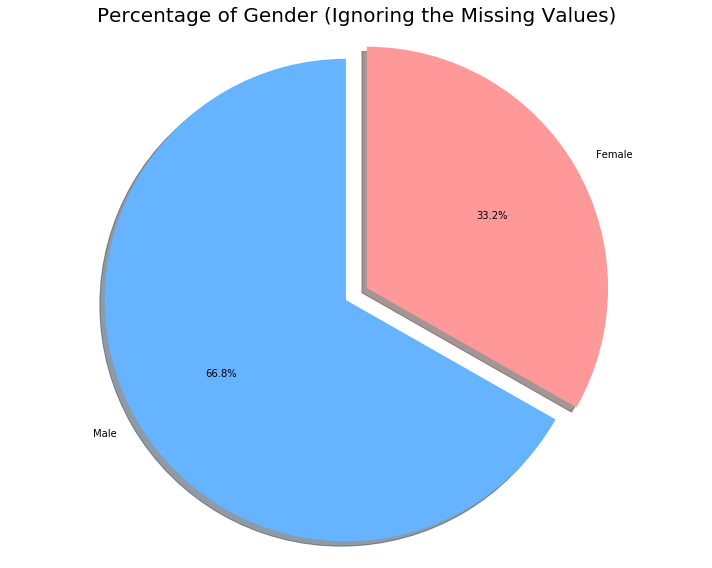

In [78]:
labels = ['Male', 'Female']
sizes = []
sizes.append(list(individual_details['gender'].value_counts())[0])
sizes.append(list(individual_details['gender'].value_counts())[1])

explode = (0.1, 0)
colors = ['#66b3ff','#ff9999']

plt.figure(figsize= (10,8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=90)

plt.title('Percentage of Gender (Ignoring the Missing Values)',fontsize = 20)
plt.axis('equal')
plt.tight_layout()

In [79]:
dates = list(confirmed_df.columns[4:])
dates = list(pd.to_datetime(dates))
dates_india = dates[8:]

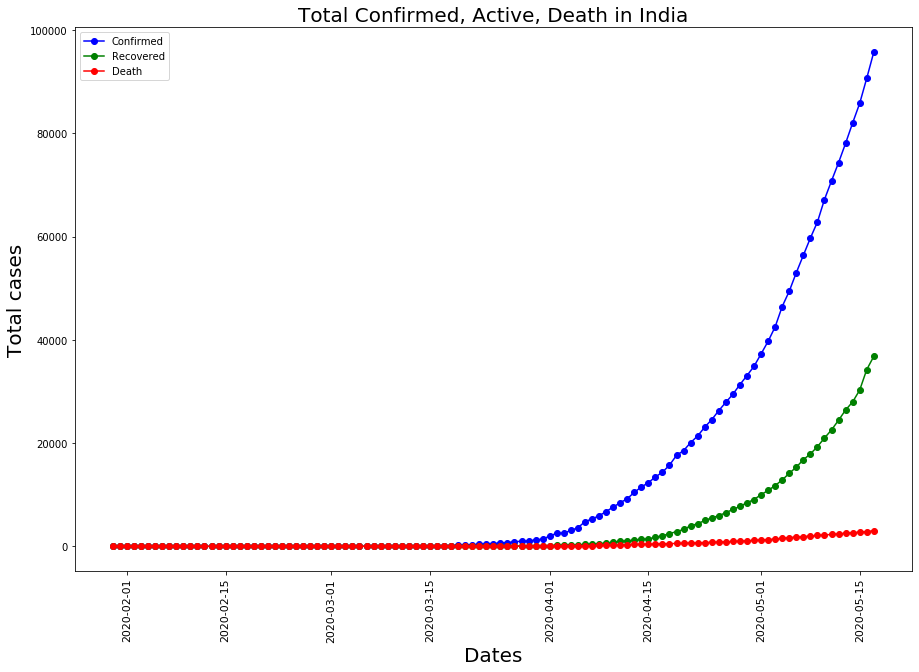

In [80]:
df1 = confirmed_df.groupby('Country/Region').sum().reset_index()
df2 = deaths_df.groupby('Country/Region').sum().reset_index()
df3 = recovered_df.groupby('Country/Region').sum().reset_index()

k = df1[df1['Country/Region']=='India'].loc[:,'1/30/20':]
india_confirmed = k.values.tolist()[0] 

k = df2[df2['Country/Region']=='India'].loc[:,'1/30/20':]
india_deaths = k.values.tolist()[0] 

k = df3[df3['Country/Region']=='India'].loc[:,'1/30/20':]
india_recovered = k.values.tolist()[0] 

plt.figure(figsize= (15,10))
plt.xticks(rotation = 90 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('Total cases',fontsize = 20)
plt.title("Total Confirmed, Active, Death in India" , fontsize = 20)

ax1 = plt.plot_date(y= india_confirmed,x= dates_india,label = 'Confirmed',linestyle ='-',color = 'b')
ax2 = plt.plot_date(y= india_recovered,x= dates_india,label = 'Recovered',linestyle ='-',color = 'g')
ax3 = plt.plot_date(y= india_deaths,x= dates_india,label = 'Death',linestyle ='-',color = 'r')
plt.legend();

In [81]:
df = pd.read_csv('novel-corona-virus-2019-dataset/covid_19_india.csv')
data = df.copy()
data['Date'] = data['Date'].apply(pd.to_datetime)
data.drop(['Sno', 'Time'],axis=1,inplace=True)

# collect present data
from datetime import date
data_apr = data[data['Date'] > pd.Timestamp(date(2020,4,12))]

# prepaing data state wise
state_cases = data_apr.groupby('State/UnionTerritory')['Confirmed','Deaths','Cured'].max().reset_index()
state_cases['Active'] = state_cases['Confirmed'] - (state_cases['Deaths']- state_cases['Cured'])
state_cases["Death Rate (per 100)"] = np.round(100*state_cases["Deaths"]/state_cases["Confirmed"],2)
state_cases["Cure Rate (per 100)"] = np.round(100*state_cases["Cured"]/state_cases["Confirmed"],2)

In [82]:
state_details = pd.pivot_table(df, values=['Confirmed','Deaths','Cured'], index='State/UnionTerritory', aggfunc='max')
state_details['Recovery Rate'] = round(state_details['Cured'] / state_details['Confirmed'],2)
state_details['Deaths']['Madhya Pradesh#']=119

state_details['Deaths']=state_details['Deaths'].astype(np.float32)
#state_details=state_details.reset_index()
state_details['Active']=state_details['Confirmed']-state_details['Cured']-state_details['Deaths']

state_details['Death Rate'] = round(state_details['Deaths'] /state_details['Confirmed'], 2)
state_details = state_details.sort_values(by='Confirmed', ascending= False)
#state_details.style.background_gradient(cmap='PuBuGn')
state_details.style.bar(subset=['Confirmed'], color='#FDD017')\
                    .bar(subset=['Cured'], color='lime')\
                    .bar(subset=['Deaths'], color='red')\
                    .bar(subset=['Active'], color='#0000FF')\
                    .bar(subset=['Recovery Rate'], color='#B1FB17')\
                    .bar(subset=['Death Rate'], color='#C0C0C0')

,Confirmed,Cured,Deaths,Recovery Rate,Active,Death Rate
State/UnionTerritory,,,,,,
Maharashtra,25922,5547,975.000000,0.210000,19400.000000,0.040000
Gujarat,9267,3562,566.000000,0.380000,5139.000000,0.060000
Tamil Nadu,9227,2176,64.000000,0.240000,6987.000000,0.010000
Delhi,7998,2858,106.000000,0.360000,5034.000000,0.010000
Rajasthan,4328,2459,121.000000,0.570000,1748.000000,0.030000
Madhya Pradesh,4173,2004,232.000000,0.480000,1937.000000,0.060000
Uttar Pradesh,3729,1902,83.000000,0.510000,1744.000000,0.020000
West Bengal,2290,702,207.000000,0.310000,1381.000000,0.090000
Andhra Pradesh,2137,1142,47.000000,0.530000,948.000000,0.020000


In [83]:
state_testing = pd.read_csv('novel-corona-virus-2019-dataset/StatewiseTestingDetails.csv')
state_testing

,Date,State,TotalSamples,Negative,Positive
0,2020-04-17,Andaman and Nicobar Islands,1403.0,1210.0,12.0
1,2020-04-24,Andaman and Nicobar Islands,2679.0,NaN,27.0
2,2020-04-27,Andaman and Nicobar Islands,2848.0,NaN,33.0
3,2020-05-01,Andaman and Nicobar Islands,3754.0,NaN,33.0
4,2020-04-02,Andhra Pradesh,1800.0,1175.0,132.0
...,...,...,...,...,...
1017,2020-05-09,West Bengal,39368.0,NaN,1786.0
1018,2020-05-10,West Bengal,43414.0,NaN,1939.0
1019,2020-05-11,West Bengal,47615.0,NaN,2063.0
1020,2020-05-12,West Bengal,52622.0,NaN,2173.0


In [84]:
#Testing
labs = pd.read_csv("novel-corona-virus-2019-dataset/ICMRTestingLabs.csv")
fig = px.treemap(labs, path=['state','city'],
                  color='city', hover_data=['lab','address'],
                  color_continuous_scale='reds')
fig.show()

In [85]:
testing=state_testing.groupby('State').sum().reset_index()
testing=testing.sort_values(['TotalSamples'], ascending=True)
fig = px.bar(testing, 
             x="TotalSamples",
             y="State", 
             orientation='h',
             height=800,
             title='Testing statewise insight')
fig.show()

In [86]:
#Laboratory
import plotly.express as px
values = list(ICMR_labs['state'].value_counts())
names = list(ICMR_labs['state'].value_counts().index)
df = pd.DataFrame(list(zip(values, names)), 
               columns =['values', 'names'])

fig = px.bar(df, 
             x="values", 
             y="names", 
             orientation='h',
             height=1000,
             title='ICMR Testing Centers in each State')
fig.show()


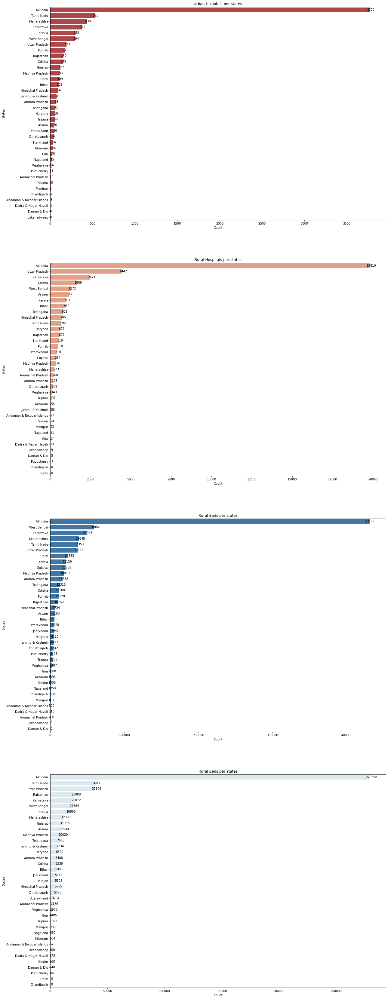

<Figure size 432x288 with 0 Axes>

In [87]:
#Hospital Bed
plt.figure(figsize=(20,60))
plt.subplot(4,1,1)
hospital_beds=hospital_beds.sort_values('NumUrbanHospitals_NHP18', ascending= False)
sns.barplot(data=hospital_beds,y='State/UT',x='NumUrbanHospitals_NHP18',color=sns.color_palette('RdBu')[0])
plt.title('Urban Hospitals per states')
plt.xlabel('Count')
plt.ylabel('States')
for i in range(hospital_beds.shape[0]):
    count = hospital_beds.iloc[i]['NumUrbanHospitals_NHP18']
    plt.text(count+10,i,count,ha='center',va='center')

plt.subplot(4,1,2)
hospital_beds=hospital_beds.sort_values('NumRuralHospitals_NHP18', ascending= False)
sns.barplot(data=hospital_beds,y='State/UT',x='NumRuralHospitals_NHP18',color=sns.color_palette('RdBu')[1])
plt.title('Rural Hospitals per states')
plt.xlabel('Count')
plt.ylabel('States')
for i in range(hospital_beds.shape[0]):
    count = hospital_beds.iloc[i]['NumRuralHospitals_NHP18']
    plt.text(count+100,i,count,ha='center',va='center')

plt.subplot(4,1,3)
hospitalBeds=hospital_beds.sort_values('NumUrbanBeds_NHP18', ascending= False)
sns.barplot(data=hospitalBeds,y='State/UT',x='NumUrbanBeds_NHP18',color=sns.color_palette('RdBu')[5])
plt.title('Rural Beds per states')
plt.xlabel('Count')
plt.ylabel('States')
for i in range(hospitalBeds.shape[0]):
    count = hospitalBeds.iloc[i]['NumUrbanBeds_NHP18']
    plt.text(count+1500,i,count,ha='center',va='center')

plt.subplot(4,1,4)
hospitalBeds=hospitalBeds.sort_values('NumRuralBeds_NHP18', ascending= False)
sns.barplot(data=hospitalBeds,y='State/UT',x='NumRuralBeds_NHP18',color=sns.color_palette('RdBu')[3])
plt.title('Rural Beds per states')
plt.xlabel('Count')
plt.ylabel('States')
for i in range(hospitalBeds.shape[0]):
    count = hospitalBeds.iloc[i]['NumRuralBeds_NHP18']
    plt.text(count+1500,i,count,ha='center',va='center')

plt.show()
plt.tight_layout()

In [88]:
#contaminated Zones
zone=pd.read_csv('novel-corona-virus-2019-dataset/lockdownindiawarningzones.csv')
zone.style.set_properties(**{'background-color': 'black',
                           'color': 'lawngreen',
                           'border-color': 'white'})

In [89]:
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]}')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()
    
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

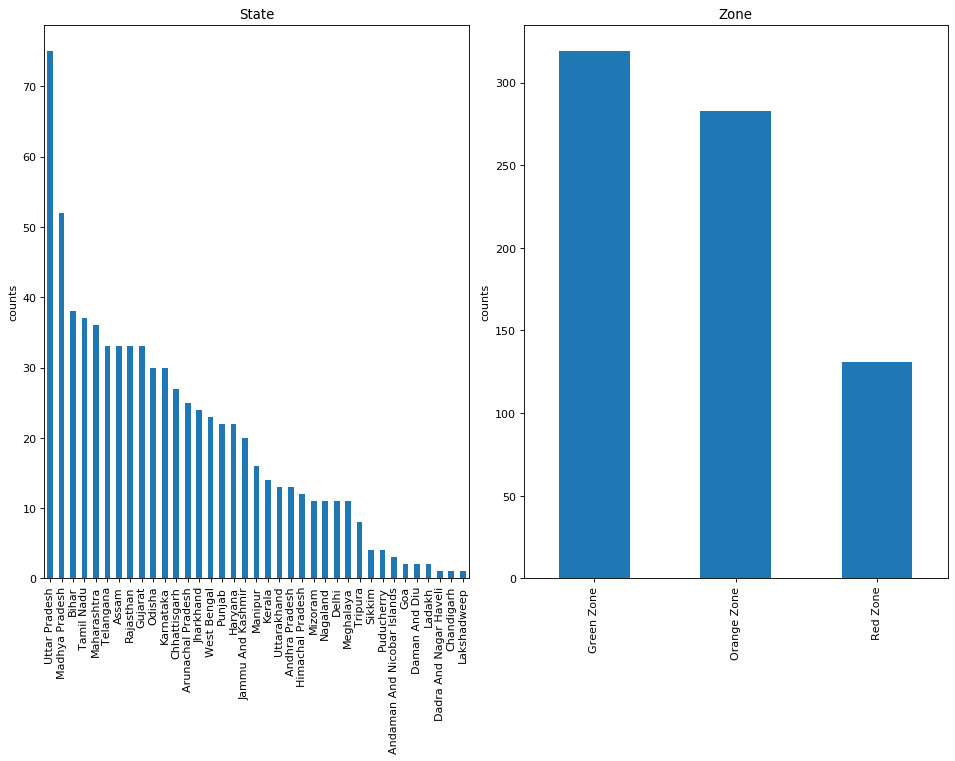

In [90]:
plotPerColumnDistribution(zone, 10, 5)

In [91]:
fig = px.treemap(zone, path=["State",'Zone','District'],
                  color='Zone',
                 color_discrete_map={'(?)':'black','Green Zone':'#00FF00', 'Red Zone':'#ff0000', 'Orange Zone':'#FFA500'},
                 hover_data=['Zone'])
fig.show()

In [ ]:
#Forcasing
#Sigmoid
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
# Any results you write to the current directory are saved as output.
train=pd.read_csv('/kaggle/input/coronavirus-2019ncov/covid-19-all.csv')

In [ ]:
train.head(5)

In [ ]:
country_df = train[train['Country/Region']=='India'].groupby('Date')['Confirmed','Deaths'].sum()
country_df['day_count'] = list(range(1,len(country_df)+1))
ydata = country_df.Confirmed
xdata = country_df.day_count
country_df['rate'] = (country_df.Confirmed-country_df.Confirmed.shift(1))/country_df.Confirmed
country_df['increase'] = (country_df.Confirmed-country_df.Confirmed.shift(1))

plt.plot(xdata, ydata, 'o')
plt.title("India")
plt.ylabel("Population infected")
plt.xlabel("Days")
plt.show()

[92.63362383  1.75222064  4.22892906]


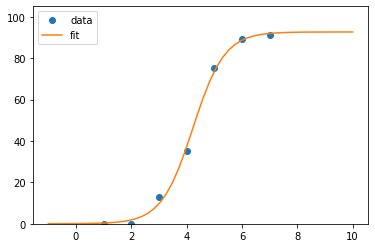

In [92]:
from scipy.optimize import curve_fit
import pylab


def sigmoid(x,c,a,b):
     y = c*1 / (1 + np.exp(-a*(x-b)))
     return y
#country_df.ConfirmedCases
#country_df.day_count
xdata = np.array([1, 2, 3,4, 5, 6, 7])
ydata = np.array([0, 0, 13, 35, 75, 89, 91])

#([low_a,low_b],[high_a,high_b])
#low x --> low b
#high y --> high c
#a is the sigmoidal shape.
popt, pcov = curve_fit(sigmoid, xdata, ydata, method='dogbox',bounds=([0.,0., 0.],[100,2, 10.]))
print(popt)

x = np.linspace(-1, 10, 50)
y = sigmoid(x, *popt)

pylab.plot(xdata, ydata, 'o', label='data')
pylab.plot(x,y, label='fit')
pylab.ylim(-0.05, 105)
pylab.legend(loc='best')

In [ ]:
**Sigmoid function,

Here is a snap of how I learnt to fit Sigmoid Function - y = c/(1+np.exp(-a*(x-b))) and 3 coefficients [c, a, b]:

c - the maximum value (eventual maximum infected people, the sigmoid scales to this value eventually)
a - the sigmoidal shape (how the infection progress. The smaller, the softer the sigmoidal shape is)
b - the point where sigmoid start to flatten from steepening (the midpoint of sigmoid, when the rate of increase start to slow down)

In [93]:
in_df = train[train['Country/Region']=='India'].groupby('Date')['Confirmed','Deaths','Recovered'].sum().reset_index(False)
in_df['Active']=in_df['Confirmed']-in_df['Deaths']-in_df['Recovered']
in_df = in_df[in_df.Active>=100]

NameError: name 'train' is not defined

In [ ]:
from scipy.optimize import curve_fit
import pylab
from datetime import timedelta

in_df['day_count'] = list(range(1,len(in_df)+1))
in_df['increase'] = (in_df.Active-in_df.Active.shift(1))
in_df['rate'] = (in_df.Active-in_df.Active.shift(1))/in_df.Active


def sigmoid(x,c,a,b):
     y = c*1 / (1 + np.exp(-a*(x-b)))
     return y

xdata = np.array(list(in_df.day_count)[::2])
ydata = np.array(list(in_df.Active)[::2])

population=1.332*10**9
popt, pcov = curve_fit(sigmoid, xdata, ydata, method='dogbox',bounds=([0.,0., 0.],[population,6, 100.]))
print(popt)

In [ ]:
From this, its seen that in case of India if the graph goes like that:
max Active case: 26500 ☠️
curve stop steepening, start flattening by day: 39 ,which is: 22/04/2020
curve flattens by day: 78 which is: 31/05/2020

In [ ]:
#SEIR Model
The SEIR models the flows of people between four states: susceptible (S), exposed (E), infected (I), and resistant (R).

Each of those variables represents the number of people in those groups. The parameters alpha and beta partially control how fast people move from being susceptible to exposed (beta), from exposed to infected (sigma), and from infected to resistant (gamma). This model has two additional parameters; one is the background mortality (mu) which is unaffected by disease-state, while the other is vaccination (nu). The vaccination moves people from the susceptible to resistant directly, without becoming exposed or infected.

The SEIR differs from the SIR model in the addition of a latency period. Individuals who are exposed (E) have had contact with an infected person, but are not themselves infectious.

Instructions: The boxes on the right side of the page control the parameters of the model. The page should load with some parameters already in the box. Click "submit" to run the model. The parameters can all be modified and the model re-run. The parameters are Beta The parameter controlling how often a susceptible-infected contact results in a new exposure. Gamma The rate an infected recovers and moves into the resistant phase. Sigma The rate at which an exposed person becomes infective. Mu The natural mortality rate (this is unrelated to disease). This models a population of a constant size, Initial susceptible The number of susceptible individuals at the beginning of the model run. Initial exposed The number of exposed individuals at the beginning of the model run. Initial infected The number of infected individuals at the beginning of the model run. Initial recovered The number of recovered individuals at the beginning of the model run. Days Controls how long the model will run. This program runs on your computer, so some computers may run faster than others. It is probably a good idea not to set the number iterations or the initial populations too high, since it will take longer to run. Note that cookies must be enabled for the algorithm to function.

In [ ]:
Details: This is an ordinary differential equation model, described by the following equation: derivative of S with respect to t equals The simulation uses the fourth-order Runge-Kutta algorithm to solve it numerically, with a step size fixed at 0.01, written in JavaScript. The plotting methods are from the flot module. Both the ode simulation and the script in this page calling it are new, so there may still be some unanticipated bugs (I am also fairly new to the language, so my code may be inefficient or bizarre in places). Internet Explorer may not work since it has not yet adopted the canvas element, which is used in plotting.

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os
from tqdm.notebook import tqdm
from scipy.integrate import solve_ivp
import numpy
import datetime
from datetime import timedelta

In [ ]:
# Susceptible equation
def dS_dt(S, I, R_t, T_inf):
    return -(R_t / T_inf) * I * S

# Exposed equation
def dE_dt(S, E, I, R_t, T_inf, T_inc):
    return (R_t / T_inf) * I * S - (T_inc**-1) * E

# Infected equation
def dI_dt(I, E, T_inc, T_inf):
    return (T_inc**-1) * E - (T_inf**-1) * I

# Recovered/Remove/deceased equation
def dR_dt(I, T_inf):
    return (T_inf**-1) * I

def SEIR_model(t, y, R_t, T_inf, T_inc):
    
    if callable(R_t):
        reproduction = R_t(t)
    else:
        reproduction = R_t
        
    S, E, I, R = y
    
    S_out = dS_dt(S, I, reproduction, T_inf)
    E_out = dE_dt(S, E, I, reproduction, T_inf, T_inc)
    I_out = dI_dt(I, E, T_inc, T_inf)
    R_out = dR_dt(I, T_inf)
    
    return [S_out, E_out, I_out, R_out]

In [95]:
train = pd.read_csv('novel-corona-virus-2019-dataset/train.csv')
test = pd.read_csv('novel-corona-virus-2019-dataset/test.csv')
train['Date_datetime'] = train['Date'].apply(lambda x: (datetime.datetime.strptime(x, '%Y-%m-%d')))

In [96]:
pop_info = pd.read_csv('novel-corona-virus-2019-dataset/population_data.csv')
country_pop = pop_info.query('Type == "Country/Region"')
province_pop = pop_info.query('Type == "Province/State"')
country_lookup = dict(zip(country_pop['Name'], country_pop['Population']))
province_lookup = dict(zip(province_pop['Name'], province_pop['Population']))

In [97]:
def plot_model_and_predict(data, pop, solution, title='SEIR model'):
    sus, exp, inf, rec = solution.y
    
    f = plt.figure(figsize=(16,5))
    ax = f.add_subplot(1,2,1)
    #ax.plot(sus, 'b', label='Susceptible');
    ax.plot(exp, 'y', label='Exposed');
    ax.plot(inf, 'r', label='Infected');
    ax.plot(rec, 'c', label='Recovered/deceased');
    plt.title(title)
    plt.xlabel("Days", fontsize=10);
    plt.ylabel("Fraction of population", fontsize=10);
    plt.legend(loc='best');
    
    ax2 = f.add_subplot(1,2,2)
    preds = np.clip((inf + rec) * pop ,0,np.inf)
    ax2.plot(range(len(data)),preds[:len(data)],label = 'Predict ConfirmedCases')
    ax2.plot(range(len(data)),data['ConfirmedCases'])
    plt.title('Model predict and data')
    plt.ylabel("Population", fontsize=10);
    plt.xlabel("Days", fontsize=10);
    plt.legend(loc='best');

In [98]:
Country = 'India'
N = pop_info[pop_info['Name']==Country]['Population'].tolist()[0] # India Population 

# Load dataset of Hubei
train_loc = train[train['Country_Region']==Country].query('ConfirmedCases > 0')
if len(train_loc)==0:
    train_loc = train[train['Province_State']==Country].query('ConfirmedCases > 0')

n_infected = train_loc['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
max_days = len(train_loc)# how many days want to predict

# Initial stat for SEIR model
s = (N - n_infected)/ N
e = 0.
i = n_infected / N
r = 0.

# Define all variable of SEIR model 
T_inc = 5.2  # average incubation period
T_inf = 2.9 # average infectious period
R_0 = 3.954 # reproduction number

## Solve the SEIR model 
sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(R_0, T_inf, T_inc), 
                t_eval=np.arange(max_days))

## Plot result
plot_model_and_predict(train_loc, N, sol, title = 'SEIR Model (without intervention)')

NameError: name 'SEIR_model' is not defined

In [ ]:
# Define all variable of SEIR model 
T_inc = 5.2  # average incubation period
T_inf = 2.9  # average infectious period

# Define the intervention parameters (fit result, latter will show how to fit)
R_0, cfr, k, L=[ 3.95469597 , 0.04593316 , 3.      ,   15.32328881]

def time_varying_reproduction(t): 
    return R_0 / (1 + (t/L)**k)

sol2 = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc), 
                t_eval=np.arange(max_days))

plot_model_and_predict(train_loc, N, sol2, title = 'SEIR Model (with intervention)')

In [99]:
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_log_error, mean_squared_error

ModuleNotFoundError: No module named 'sklearn'

In [ ]:
def cumsum_signal(vec):
    temp_val = 0
    vec_new = []
    for i in vec:
        if i > temp_val:
            vec_new.append(i)
            temp_val = i
        else:
            vec_new.append(temp_val)
    return vec_new

In [ ]:
# Use a constant reproduction number
def eval_model_const(params, data, population, return_solution=False, forecast_days=0):
    R_0, cfr = params # Paramaters, R0 and cfr 
    N = population # Population of each country
    n_infected = data['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
    max_days = len(data) + forecast_days # How many days want to predict
    s, e, i, r = (N - n_infected)/ N, 0, n_infected / N, 0 #Initial stat for SEIR model
    
    # R0 become half after intervention days
    def time_varying_reproduction(t):
        if t > 80: # we set intervention days = 80
            return R_0 * 0.5
        else:
            return R_0
    
    # Solve the SEIR differential equation.
    sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc),
                    t_eval=np.arange(0, max_days))
    
    sus, exp, inf, rec = sol.y
    # Predict confirmedcase
    y_pred_cases = np.clip((inf + rec) * N ,0,np.inf)
    y_true_cases = data['ConfirmedCases'].values
    
    # Predict Fatalities by remove * fatality rate(cfr)
    y_pred_fat = np.clip(rec*N* cfr, 0, np.inf)
    y_true_fat = data['Fatalities'].values
    
    optim_days = min(20, len(data))  # Days to optimise for
    weights = 1 / np.arange(1, optim_days+1)[::-1]  # Recent data is more heavily weighted
    
    # using mean squre log error to evaluate
    msle_cases = mean_squared_log_error(y_true_cases[-optim_days:], y_pred_cases[-optim_days:], weights)
    msle_fat = mean_squared_log_error(y_true_fat[-optim_days:], y_pred_fat[-optim_days:], weights)
    msle_final = np.mean([msle_cases, msle_fat])
    
    if return_solution:
        return msle_final, sol
    else:
        return msle_final


In [ ]:
# Use a Hill decayed reproduction number
def eval_model_decay(params, data, population, return_solution=False, forecast_days=0):
    R_0, cfr, k, L = params # Paramaters, R0 and cfr 
    N = population # Population of each country
    n_infected = data['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
    max_days = len(data) + forecast_days # How many days want to predict
    s, e, i, r = (N - n_infected)/ N, 0, n_infected / N, 0 #Initial stat for SEIR model
    
    # https://github.com/SwissTPH/openmalaria/wiki/ModelDecayFunctions   
    # Hill decay. Initial values: R_0=2.2, k=2, L=50
    def time_varying_reproduction(t): 
        return R_0 / (1 + (t/L)**k)
    
    # Solve the SEIR differential equation.
    sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc),
                    t_eval=np.arange(0, max_days))
    
    sus, exp, inf, rec = sol.y
    # Predict confirmedcase
    y_pred_cases = np.clip((inf + rec) * N ,0,np.inf)
    y_true_cases = data['ConfirmedCases'].values
    
    # Predict Fatalities by remove * fatality rate(cfr)
    y_pred_fat = np.clip(rec*N* cfr, 0, np.inf)
    y_true_fat = data['Fatalities'].values
    
    optim_days = min(20, len(data))  # Days to optimise for
    weights = 1 / np.arange(1, optim_days+1)[::-1]  # Recent data is more heavily weighted
    
    # using mean squre log error to evaluate
    msle_cases = mean_squared_log_error(y_true_cases[-optim_days:], y_pred_cases[-optim_days:], weights)
    msle_fat = mean_squared_log_error(y_true_fat[-optim_days:], y_pred_fat[-optim_days:], weights)
    msle_final = np.mean([msle_cases, msle_fat])
    
    if return_solution:
        return msle_final, sol
    else:
        return msle_final

In [ ]:
len(train[-7:]),len(train[:-7]),len(train)

In [ ]:
import plotly.express as px
from matplotlib import dates
import plotly.graph_objects as go

def fit_model_new(data, area_name, initial_guess=[2.2, 0.02, 2, 50], 
              bounds=((1, 20), (0, 0.15), (1, 3), (1, 100)), make_plot=True, decay_mode = None):
    
    if area_name in ['France']:# France last data looks weird, remove it
        train = data.query('ConfirmedCases > 0').copy()[:-1]
    #elif area_name in ['Virgin Islands']:
    #    train = data[:-3].query('ConfirmedCases > 0').copy()
    else:
        train = data.query('ConfirmedCases > 0').copy()
    
    ####### Split Train & Valid #######
    #valid_data = train[-1:]
    train_data = train
    
    ####### If this country have no ConfirmedCase, return 0 #######
    if len(train_data) == 0:
        result_zero = np.zeros((43))
        return pd.DataFrame({'ConfirmedCases':result_zero,'Fatalities':result_zero}), 0 
    
    ####### Load the population of area #######
    try:
        #population = province_lookup[area_name]
        population = pop_info[pop_info['Name']==area_name]['Population'].tolist()[0]
    except IndexError:
        print ('country not in population set, '+str(area_name))
        population = 1000000 
    
    
    if area_name == 'US':
        population = 327200000
    if area_name == 'Global':
        population = 7744240900
        
    cases_per_million = train_data['ConfirmedCases'].max() * 10**6 / population
    n_infected = train_data['ConfirmedCases'].iloc[0]
    
    ####### Total case/popuplation below 1, reduce country population #######
    if cases_per_million < 1:
        #print ('reduce pop divide by 100')
        population = population/100
        
    ####### Fit the real data by minimize the MSLE #######
    res_const = minimize(eval_model_const, [2.2, 0.02], bounds=((1, 20), (0, 0.15)),
                         args=(train_data, population, False),
                         method='L-BFGS-B')

    res_decay = minimize(eval_model_decay, initial_guess, bounds=bounds,
                         args=(train_data, population, False),
                         method='L-BFGS-B')
    
    ####### Align the date information #######
    test_end = datetime.datetime.strptime('2020-05-07','%Y-%m-%d')
    test_start = datetime.datetime.strptime('2020-03-26','%Y-%m-%d')
    train_test = data[data.Date_datetime>=test_start]
    test_period = (test_end - test_start).days
    train_max = train_data.Date_datetime.max()
    train_min = train_data.Date_datetime.min()
    add_date = 0
    delta_days =(test_end - train_max).days
    train_add_time=[]

    if train_min > test_start:
        add_date = (train_min-test_start).days
        last = train_min-timedelta(add_date)
        train_add_time = np.arange(last, train_min, dtype='datetime64[D]').tolist()
        train_add_time = pd.to_datetime(train_add_time)
        dates_all = train_add_time.append(pd.to_datetime(np.arange(train_min, test_end+timedelta(1), dtype='datetime64[D]')))
    else:
        dates_all = pd.to_datetime(np.arange(train_min, test_end+timedelta(1), dtype='datetime64[D]'))


    ####### Auto find the best decay function ####### 
    if decay_mode is None:
        if res_const.fun < res_decay.fun :
            msle, sol = eval_model_const(res_const.x, train_data, population, True, delta_days+add_date)
            res = res_const

        else:
            msle, sol = eval_model_decay(res_decay.x, train_data, population, True, delta_days+add_date)
            res = res_decay
            R_0, cfr, k, L = res.x
    else:
        if decay_mode =='day_decay':
            msle, sol = eval_model_const(res_const.x, train_data, population, True, delta_days+add_date)
            res = res_const
        else:
            msle, sol = eval_model_decay(res_decay.x, train_data, population, True, delta_days+add_date)
            res = res_decay
            R_0, cfr, k, L = res.x

    ####### Predict the result by using best fit paramater of SEIR model ####### 
    sus, exp, inf, rec = sol.y
    
    y_pred = pd.DataFrame({
        'ConfirmedCases': cumsum_signal(np.diff((inf + rec) * population, prepend=n_infected).cumsum()),
       # 'ConfirmedCases': [inf[0]*population for i in range(add_date)]+(np.clip((inf + rec) * population,0,np.inf)).tolist(),
       # 'Fatalities': [rec[0]*population for i in range(add_date)]+(np.clip(rec, 0, np.inf) * population * res.x[1]).tolist()
        'Fatalities': cumsum_signal((np.clip(rec * population * res.x[1], 0, np.inf)).tolist())
    })

    #y_pred_valid = y_pred.iloc[len(train_data):len(train_data)+len(valid_data)]
    y_pred_valid = y_pred.iloc[:len(train_data)]
    y_pred_test = pd.concat([train_test[['ConfirmedCases', 'Fatalities']],y_pred.iloc[-(delta_days):]], ignore_index=True)
    y_true_valid = train_data[['ConfirmedCases', 'Fatalities']]
    #y_true_valid = valid_data[['ConfirmedCases', 'Fatalities']]
    #print (len(y_pred),train_min)
    
    ####### Calculate MSLE ####### 
    valid_msle_cases = mean_squared_log_error(y_true_valid['ConfirmedCases'], y_pred_valid['ConfirmedCases'])
    valid_msle_fat = mean_squared_log_error(y_true_valid['Fatalities'], y_pred_valid['Fatalities'])
    valid_msle = np.mean([valid_msle_cases, valid_msle_fat])
    
    ####### Plot the fit result of train data and forecast after 300 days ####### 
    if make_plot:
        if len(res.x)<=2:
            print(f'Validation MSLE: {valid_msle:0.5f}, using intervention days decay, Reproduction number(R0) : {res.x[0]:0.5f}, Fatal rate : {res.x[1]:0.5f}')
        else:
            print(f'Validation MSLE: {valid_msle:0.5f}, using Hill decay, Reproduction number(R0) : {res.x[0]:0.5f}, Fatal rate : {res.x[1]:0.5f}, K : {res.x[2]:0.5f}, L: {res.x[3]:0.5f}')
        
        ####### Plot the fit result of train data dna SEIR model trends #######

        f = plt.figure(figsize=(16,5))
        ax = f.add_subplot(1,2,1)
        ax.plot(exp, 'y', label='Exposed');
        ax.plot(inf, 'r', label='Infected');
        ax.plot(rec, 'c', label='Recovered/deceased');
        plt.title('SEIR Model Trends')
        plt.xlabel("Days", fontsize=10);
        plt.ylabel("Fraction of population", fontsize=10);
        plt.legend(loc='best');
        #train_date_remove_year = train_data['Date_datetime'].apply(lambda date:'{:%m-%d}'.format(date))
        ax2 = f.add_subplot(1,2,2)
        xaxis = train_data['Date_datetime'].tolist()
        xaxis = dates.date2num(xaxis)
        hfmt = dates.DateFormatter('%m\n%d')
        ax2.xaxis.set_major_formatter(hfmt)
        ax2.plot(np.array(train_data['Date_datetime'], dtype='datetime64[D]'),train_data['ConfirmedCases'],label='Confirmed Cases (train)', c='g')
        ax2.plot(np.array(train_data['Date_datetime'], dtype='datetime64[D]'), y_pred['ConfirmedCases'][:len(train_data)],label='Cumulative modeled infections', c='r')
        #ax2.plot(np.array(valid_data['Date_datetime'], dtype='datetime64[D]'), y_true_valid['ConfirmedCases'],label='Confirmed Cases (valid)', c='b')
        #ax2.plot(np.array(valid_data['Date_datetime'], dtype='datetime64[D]'),y_pred_valid['ConfirmedCases'],label='Cumulative modeled infections (valid)', c='y')
        plt.title('Real ConfirmedCase and Predict ConfirmedCase')
        plt.legend(loc='best');
        plt.show()
            
        ####### Forecast 300 days after by using the best paramater of train data #######
        if len(res.x)>2:
            msle, sol = eval_model_decay(res.x, train_data, population, True, 300)
        else:
            msle, sol = eval_model_const(res.x, train_data, population, True, 300)
        
        sus, exp, inf, rec = sol.y
        
        y_pred = pd.DataFrame({
            'ConfirmedCases': cumsum_signal(np.diff((inf + rec) * population, prepend=n_infected).cumsum()),
            'Fatalities': cumsum_signal(np.clip(rec, 0, np.inf) * population * res.x[1])
        })
        
        ####### Plot 300 days after of each country #######
        start = train_min
        end = start + timedelta(len(y_pred))
        time_array = np.arange(start, end, dtype='datetime64[D]')

        max_day = numpy.where(inf == numpy.amax(inf))[0][0]
        where_time = time_array[max_day]
        pred_max_day = y_pred['ConfirmedCases'][max_day]
        xy_show_max_estimation = (where_time, max_day)
        
        con = y_pred['ConfirmedCases']
        fat = y_pred['Fatalities']
        max_day_con = numpy.where(con == numpy.amax(con))[0][0] # Find the max confimed case of each country
        max_day_fat = numpy.where(fat == numpy.amax(fat))[0][0]
        max_con = numpy.amax(con)
        max_fat = numpy.amax(fat)
        where_time_con = time_array[len(time_array)-50]
        xy_show_max_estimation_confirmed = (where_time_con, max_con)
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=time_array, y=y_pred['ConfirmedCases'].astype(int),
                            mode='lines',
                            line = dict(color='red'),
                            name='Estimation Confirmed Case Start from '+ str(start.date())+ ' to ' +str(end.date())))
        fig.add_trace(go.Scatter(x=time_array, y=y_pred['Fatalities'].astype(int),
                            mode='lines',
                            line = dict(color='yellow'),
                            name='Estimation Fatalities Start from '+ str(start.date())+ ' to ' +str(end.date())))
        fig.add_trace(go.Scatter(x=time_array[:len(train)], y=train['ConfirmedCases'],
                            mode='lines',
                            name='Confirmed case until '+ str(train_max.date()),line = dict(color='green', width=4)))
        fig.add_trace(go.Scatter(x=time_array[:len(train)], y=train['Fatalities'],
                            mode='lines',
                            name='Fatalities case until '+ str(train_max.date()),line = dict(color='blue', width=4)))
        fig.add_annotation(
            x=where_time_con,
            y=max_con-(max_con/30),
            showarrow=False,
            text="Estimate Max Case around:" +str(int(max_con)),
            font=dict(
                color="Blue",
                size=15
            ))
        fig.add_annotation(
            x=where_time_con,
            y=max_fat-(max_fat/30),
            showarrow=False,
            text="Estimate Max death around:" +str(int(max_fat)),
            font=dict(
                color="Blue",
                size=15
            ))
        fig.add_annotation(
            x=time_array[len(train)-1],
            y=train['ConfirmedCases'].tolist()[-1],
            showarrow=True,
            text=f"Real Max ConfirmedCase: " +str(int(train['ConfirmedCases'].tolist()[-1]))) 
        
        fig.add_annotation(
            x=time_array[len(train)-1],
            y=train['Fatalities'].tolist()[-1],
            showarrow=True,
            text=f"Real Max Fatalities: " +str(int(train['Fatalities'].tolist()[-1]))) 
        
        fig.add_annotation(
            x=where_time,
            y=pred_max_day,
            text='Infect start decrease from: ' + str(where_time))   
        fig.update_layout(title='Estimate Confirmed Case ,'+area_name+' Total population ='+ str(int(population)), legend_orientation="h")
        fig.show()
        ###
        df = pd.DataFrame({'Values': train_data['ConfirmedCases'].tolist()+y_pred['ConfirmedCases'].tolist(),'Date_datatime':time_array[:len(train_data)].tolist()+time_array.tolist(),
                   'Real/Predict': ['ConfirmedCase' for i in range(len(train_data))]+['PredictCase' for i in range(len(y_pred))]})
        fig = px.line(df, x="Date_datatime", y="Values",color = 'Real/Predict')
        fig.show()
        plt.figure(figsize = (16,7))
        plt.plot(time_array[:len(train_data)],train_data['ConfirmedCases'],label='Confirmed case until '+ str(train_max.date()),color='g', linewidth=3.0)
        plt.plot(time_array,y_pred['ConfirmedCases'],label='Estimation Confirmed Case Start from '+ str(start.date())+ ' to ' +str(end.date()),color='r', linewidth=1.0)
        plt.annotate('Infect start decrease from: ' + str(where_time), xy=xy_show_max_estimation, size=15, color="black")
        plt.annotate('max Confirmedcase: ' + str(int(max_con)), xy=xy_show_max_estimation_confirmed, size=15, color="black")
        plt.title('Estimate Confirmed Case '+area_name+' Total population ='+ str(int(population)))
        plt.legend(loc='lower right')
        plt.show()
        

    return y_pred_test, valid_msle


In [ ]:
country = 'India'
if country not in train['Country_Region'].unique():
    country_pd_train = train[train['Province_State']==country]
else:
    country_pd_train = train[train['Country_Region']==country]

a,b = fit_model_new(country_pd_train,country,make_plot=True)

In [ ]:
#LSTM Model
import pandas as pd
import numpy as np

In [ ]:
train_df = pd.read_csv("/kaggle/input/covid19-global-forecasting-week-4/train.csv")
test_df = pd.read_csv("/kaggle/input/covid19-global-forecasting-week-4/test.csv")

In [ ]:
train_df.apply(lambda col: col.isnull().value_counts(), axis=0)
test_df.apply(lambda col: col.isna().value_counts(), axis=0)

In [ ]:
train_df["Province_State"] = train_df["Province_State"].fillna("")
test_df["Province_State"] = test_df["Province_State"].fillna("")

In [ ]:
train_df["Date"] = pd.to_datetime(train_df["Date"])
test_df["Date"] = pd.to_datetime(test_df["Date"])

In [ ]:
train_df["NewCases"] = train_df.groupby(["Country_Region", "Province_State"])["ConfirmedCases"].diff(periods=1)
train_df["NewCases"] = train_df["NewCases"].fillna(0)
train_df["NewCases"] = np.where(train_df["NewCases"] < 0, 0, train_df["NewCases"])
train_df["NewFatalities"] = train_df.groupby(["Country_Region", "Province_State"])["Fatalities"].diff(periods=1)
train_df["NewFatalities"] = train_df["NewFatalities"].fillna(0)
train_df["NewFatalities"] = np.where(train_df["NewFatalities"] < 0, 0, train_df["NewFatalities"])

In [ ]:
train_df["NewCases"] = np.log(train_df["NewCases"] + 1)
train_df["NewFatalities"] = np.log(train_df["NewFatalities"] + 1)

In [ ]:
def preprocess_train(n_prev, n_next):
    df = train_df.copy()
    input_feats, output_feats = [], []
    for i in range(1, n_prev+1):
        for feat in ["NewCases", "NewFatalities"]:
            df["{}_prev_{}".format(feat, i)] = df.groupby(["Country_Region", "Province_State"])[feat].shift(i)
            input_feats.append("{}_prev_{}".format(feat, i))
    
    output_feats.extend(["NewCases", "NewFatalities"])
    for i in range(1, n_next):
        for feat in ["NewCases", "NewFatalities"]:
            df["{}_next_{}".format(feat, i)] = df.groupby(["Country_Region", "Province_State"])[feat].shift(-i)
            output_feats.append("{}_next_{}".format(feat, i))
    df.dropna(inplace=True)       
            
    const_df = pd.get_dummies(df[["Province_State", "Country_Region"]], drop_first=True)
    time_df = df[input_feats]
    time_df = time_df.values.reshape((df.shape[0],-1,2))
    output_df = df[output_feats]
    return const_df, time_df, output_df

def preprocess_test(n_prev):
    input_feats = []
    append_df = pd.concat([train_df, test_df[test_df["Date"] == train_df["Date"].max() + timedelta(days=1)]])
    append_df.sort_values(["Country_Region", "Province_State", "Date"], ascending=[True, True, True], inplace=True)
    for i in range(1, n_prev+1):
        for feat in ["NewCases", "NewFatalities"]:
            append_df["{}_prev_{}".format(feat, i)] = append_df.groupby(["Country_Region", "Province_State"])[feat].shift(i)
            input_feats.append("{}_prev_{}".format(feat, i))
    append_df = append_df[append_df["ForecastId"].notnull()]
            
    const_df = pd.get_dummies(append_df[["Province_State", "Country_Region"]], drop_first=True)
    time_df = append_df[input_feats]
    time_df = time_df.values.reshape((append_df.shape[0],-1,2))
    return const_df, time_df

In [ ]:
n_next = (test_df["Date"].max() - train_df["Date"].max()).days

In [ ]:
from datetime import timedelta
const_df, time_df, output_df = preprocess_train(n_next, n_next)
const_test_df, time_test_df = preprocess_test(n_next)

In [ ]:
from keras.models import Model
from keras import layers
from keras import Input

In [ ]:
from keras import optimizers
time_input = Input(shape=(time_df.shape[1], time_df.shape[2]))
lstm = layers.LSTM(128)(time_input)

const_input = Input(shape=(const_df.shape[1],))

combine = layers.concatenate([lstm, const_input], axis=-1)
#lstm_out = layers.Dropout(0.1)(combine)
output = layers.Dense(output_df.shape[1], activation='softmax')(combine)

model = Model([time_input, const_input], output)
#optimizer=optimizers.SGD(lr=0.01, nesterov=True)
model.compile(optimizer='adam',
              loss='mean_squared_error',metrics=['acc'])
model.summary()

In [ ]:
model.fit([time_df, const_df], output_df, epochs=50, batch_size=128)

In [ ]:
output = model.predict([time_test_df, const_test_df])
output.shape

In [ ]:
sub_test_df = test_df[test_df["Date"] > train_df["Date"].max()]
sub_test_df = pd.concat([sub_test_df,
                         pd.DataFrame(output.reshape((-1, 2)), columns=["NewCases", "NewFatalities"], index=sub_test_df.index)],
                         axis=1)
sub_test_df["NewCases"] = np.exp(sub_test_df["NewCases"]) - 1
sub_test_df["NewFatalities"] = np.exp(sub_test_df["NewFatalities"]) - 1
sub_test_df

In [ ]:
fixed_test_df = test_df[test_df["Date"] <= train_df["Date"].max()].merge(train_df[train_df["Date"] >= test_df["Date"].min()][["Province_State","Country_Region", "Date", "ConfirmedCases", "Fatalities"]],
                                                                         how="left", on=["Province_State","Country_Region", "Date"])
fixed_test_df

In [ ]:
predict_df = pd.concat([sub_test_df, fixed_test_df]).sort_values(["Country_Region", "Province_State", "Date"],
                                                                 ascending=[True, True, True])
predict_df

In [ ]:
predict_df = predict_df.reset_index()
for i in range(len(predict_df)):
    if pd.isnull(predict_df.iloc[i]["ConfirmedCases"]):
        predict_df.loc[i, "ConfirmedCases"] = predict_df.iloc[i - 1]["ConfirmedCases"] + predict_df.iloc[i]["NewCases"]
    if pd.isnull(predict_df.iloc[i]["Fatalities"]):
        predict_df.loc[i, "Fatalities"] = predict_df.iloc[i - 1]["Fatalities"] + predict_df.iloc[i]["NewFatalities"]
predict_df

In [ ]:
assert predict_df.shape[0] == test_df.shape[0]

In [ ]:
predict_df[["ForecastId", "ConfirmedCases", "Fatalities"]].to_csv("submission.csv", index=False)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
country = "India"

target = "ConfirmedCases"
region_train_df = train_df[(train_df["Country_Region"]==country)]
region_predict_df = predict_df[(predict_df["Country_Region"]==country)]

fig = plt.figure(figsize=(10, 6))
ax1 = fig.add_axes([0, 0, 1, 1])

fig = px.line(region_train_df, x="Date", y=target, title='Prediction in India')
fig = px.line(region_predict_df, x="Date", y=target, title='Prediction in India')
fig.show()

ax1.plot(region_train_df["Date"],
         region_train_df[target],
         color="green")

ax1.plot(region_predict_df["Date"],
         region_predict_df[target],
         color="red")
plt.show()